<a href="https://colab.research.google.com/github/LeoTU911/SCC413/blob/main/CycleGAN_2_0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install dominate
!pip install visdom

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 31.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.9/55.9 KB 8.9 MB/s eta 0:00:00
  Created wheel for visdom: filename=visdom-0.2.4-py3-none-any.whl size=1408217 sha256=37e415ee524e850f8c78d936c4a8ac8fb957f1ccb7877ebd2f32213df94fd92c
  Stored in directory: /root/.cache/pip/wheels/fb/b1/fc/b05c2c1930a412f01bd07dacaeb5fd8cc4bcccf71c835b0281
Successfully built visdom


In [ ]:
import dominate
import visdom
import matplotlib.pyplot as plt
import os

In [ ]:
!git clone https://github.com/LeoTU911/SCC413/

Cloning into 'SCC413'...
remote: Enumerating objects: 592, done.
remote: Counting objects: 100% (590/590), done.
remote: Compressing objects: 100% (518/518), done.
remote: Total 592 (delta 84), reused 562 (delta 65), pack-reused 2
Receiving objects: 100% (592/592), 16.99 MiB | 12.61 MiB/s, done.
Resolving deltas: 100% (84/84), done.


In [ ]:
cd /content/SCC413/pytorch-CycleGAN

/content/SCC413/pytorch-CycleGAN


In [ ]:
!python train.py\
  --dataroot ./datasets/CUHK_Sketch2Photo/\
  --name      s2p_cyclegan\
  --model     cycle_gan\
  --batch_size   8\
  --netD      n_layers\
  --n_layers_D   5\
  --n_epochs    100\
  --n_epochs_decay 50\
  --norm      batch\
  --netG      unet_256

----------------- Options ---------------
               batch_size: 8                             	[default: 1]
                    beta1: 0.5                           
          checkpoints_dir: ./checkpoints                 
           continue_train: False                         
                crop_size: 256                           
                 dataroot: ./datasets/CUHK_Sketch2Photo/ 	[default: None]
             dataset_mode: unaligned                     
                direction: AtoB                          
              display_env: main                          
             display_freq: 400                           
               display_id: 1                             
            display_ncols: 4                             
             display_port: 8097                          
           display_server: http://localhost              
          display_winsize: 256                           
                    epoch: latest                        
 

In [ ]:
!python test.py --dataroot ./datasets/CUHK_Sketch2Photo/ --name s2p_cyclegan --model cycle_gan --netD n_layers --n_layers_D 5 --norm batch --netG unet_256

----------------- Options ---------------
             aspect_ratio: 1.0                           
               batch_size: 1                             
          checkpoints_dir: ./checkpoints                 
                crop_size: 256                           
                 dataroot: ./datasets/CUHK_Sketch2Photo/ 	[default: None]
             dataset_mode: unaligned                     
                direction: AtoB                          
          display_winsize: 256                           
                    epoch: latest                        
                     eval: False                         
                  gpu_ids: 0                             
                init_gain: 0.02                          
                init_type: normal                        
                 input_nc: 3                             
                  isTrain: False                         	[default: None]
                load_iter: 0                            

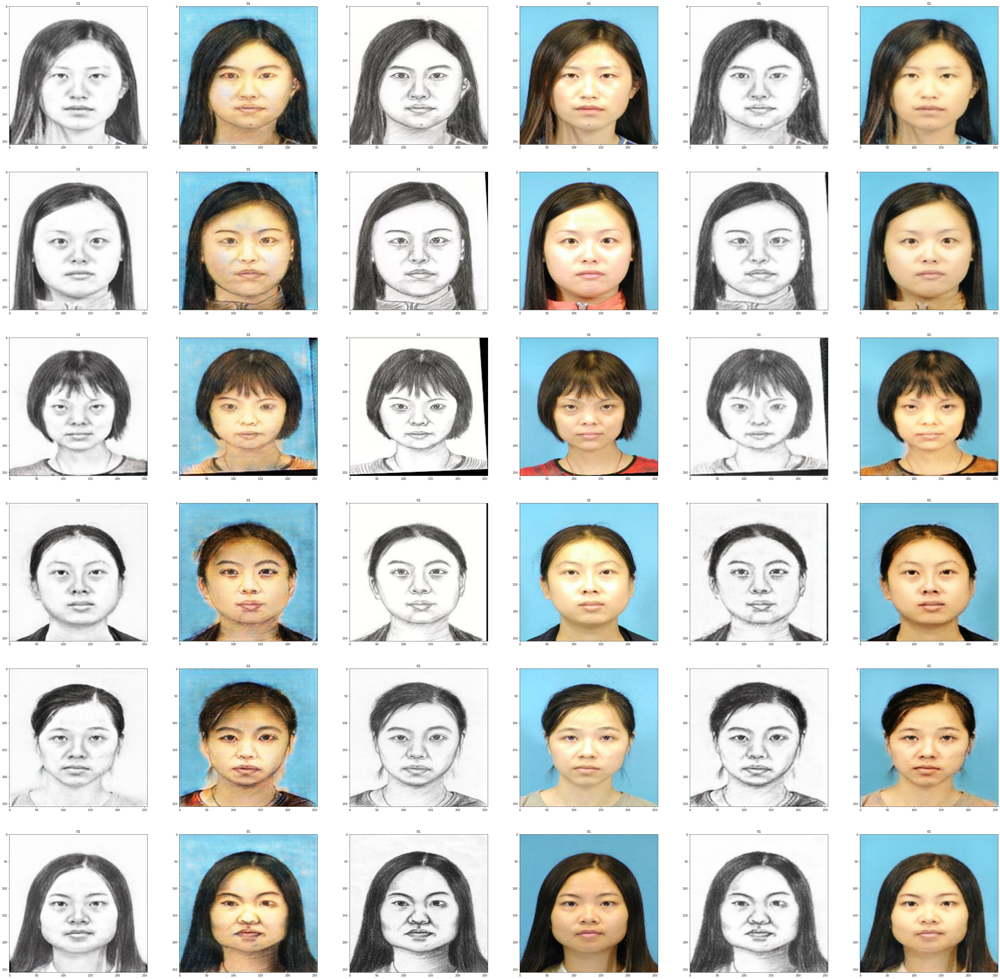

In [ ]:


result_Path = './results/s2p_cyclegan/test_latest/images'
img_List = sorted(os.listdir(result_Path))
img_Results = []
#test = img_List[1].split('_')
#print(test)

for fileName in img_List:
    img_tmp = os.path.join(result_Path, fileName)
    img_Results.append(img_tmp)

#print(img_Results)

plt.figure(figsize = (64, 64))
for i in range(1,37):
  plt.subplot(6,6,i)
  img = plt.imread(img_Results[i-1])
  title = img_List[i-1].split('-')
  plt.title(title[2])
  plt.imshow(img)